In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import anndata
import re
import h5py
import scipy.sparse as scs
import concurrent.futures
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import csc_matrix
from concurrent.futures import ThreadPoolExecutor, as_completed
import umap
import random
import multiprocessing
random.seed(123)
from joblib import Parallel, delayed
import warnings
import os
from tqdm import tqdm
import math
from PIL import Image, ImageDraw, ImageFont
import gc
import re
import multiprocessing
warnings.filterwarnings('ignore')

# QC plots and DEGs

In [13]:
files = os.listdir("h5_by_celltype_clustered/")

/tmp/ipykernel_126645/2213329661.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  output_file = 'Doublet_QC_Plots/'+adata.obs['AIFI_L3'][0]+'.png'
/tmp/ipykernel_126645/2213329661.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  output_file = 'Doublet_QC_Plots/'+adata.obs['AIFI_L3'][0]+'.png'
/tmp/ipykernel_126645/2213329661.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  output_file = 'Doublet_QC_Plots/'+adata.obs['AIFI_L

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


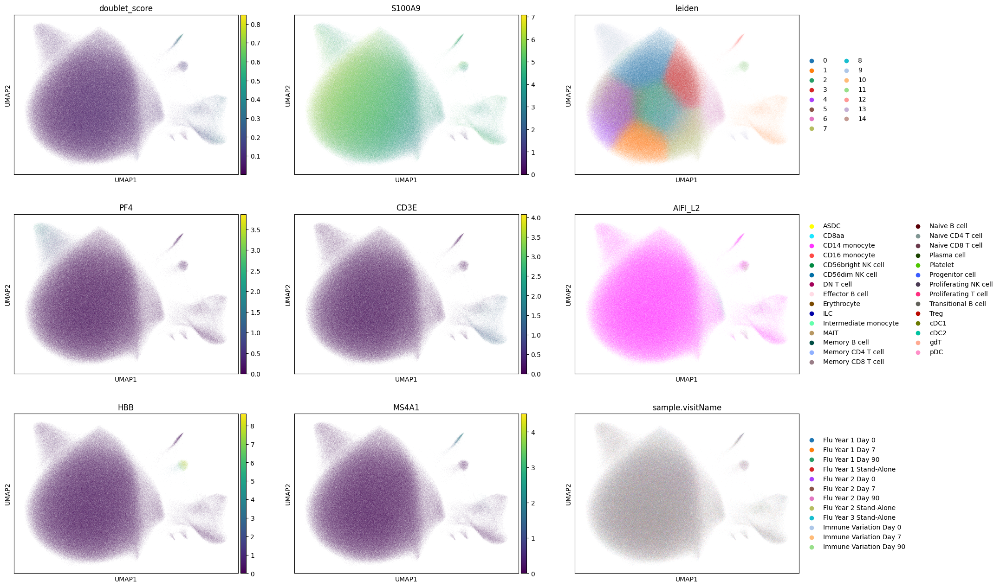

/tmp/ipykernel_126645/2213329661.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby('group').head(20).reset_index(drop=True)
/tmp/ipykernel_126645/2213329661.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby('group')
/tmp/ipykernel_126645/2213329661.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  fig.suptitle(adata.obs['AIFI_L3'][0], fontsize=50)
/tmp/ipykernel_126645/2213329661.

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


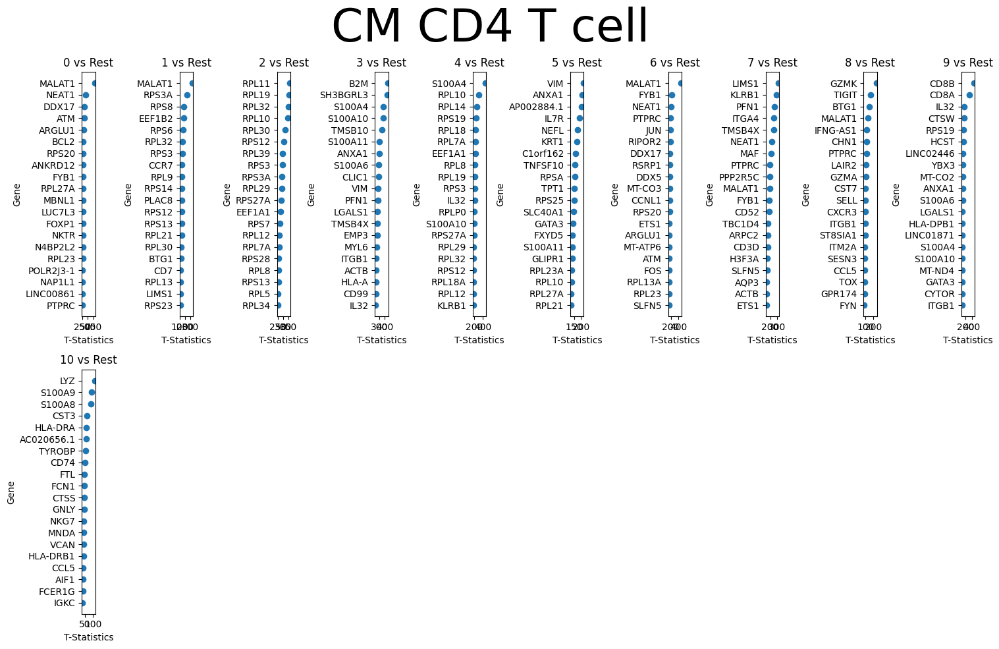

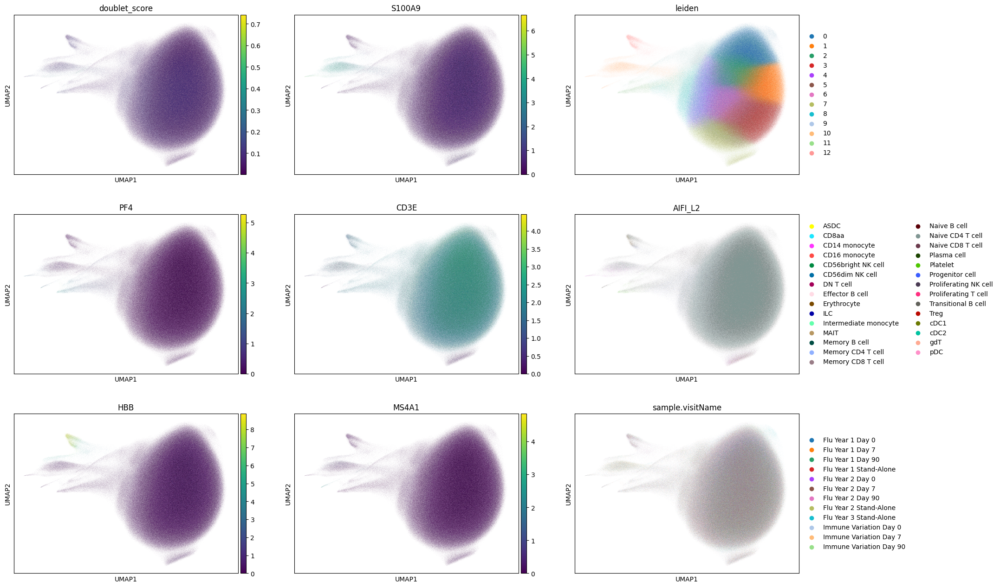

/tmp/ipykernel_126645/2213329661.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby('group').head(20).reset_index(drop=True)
/tmp/ipykernel_126645/2213329661.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby('group')
/tmp/ipykernel_126645/2213329661.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  fig.suptitle(adata.obs['AIFI_L3'][0], fontsize=50)
/tmp/ipykernel_126645/2213329661.

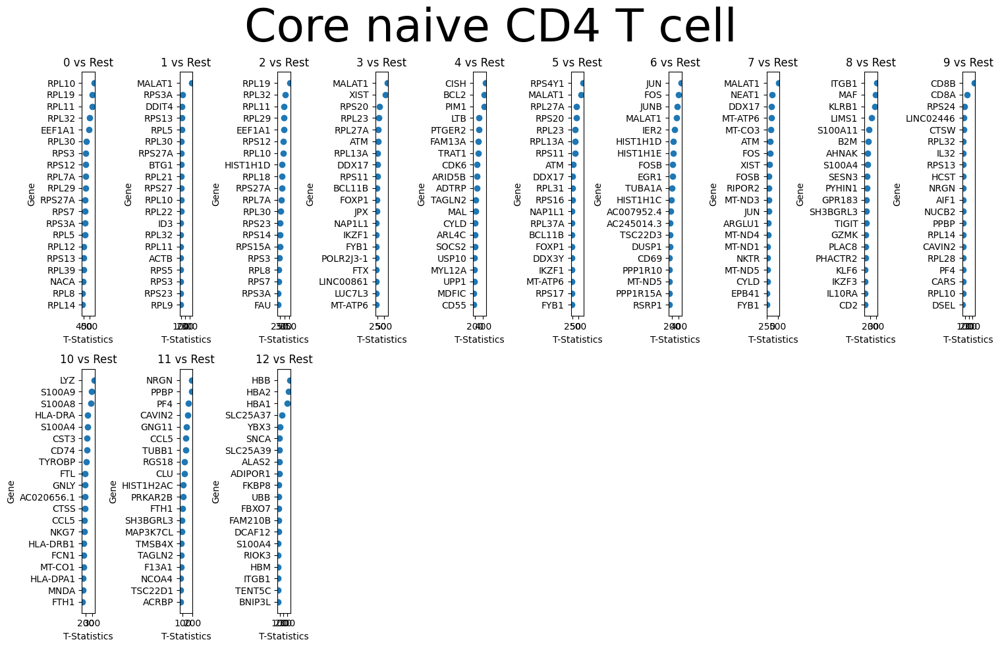

In [26]:
for i in files:
    adata=sc.read_h5ad('h5_by_celltype_clustered/'+i)
    output_file = 'Doublet_QC_Plots/'+adata.obs['AIFI_L3'][0]+'.png'
    if os.path.exists(output_file) and os.path.getsize(output_file) > 0:
        continue 
    sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
    sc.pl.umap(adata, color=['doublet_score', 'S100A9', 'leiden',
                             'PF4', 'CD3E', 'AIFI_L2', 
                             'HBB', 'MS4A1', 'sample.visitName'], ncols=3, save='_UMAP.png')

    df = sc.get.rank_genes_groups_df(adata, group=None)
    df = df.groupby('group').head(20).reset_index(drop=True)
    groups = df.groupby('group')

    n_groups = len(groups)
    n_cols = 10
    n_rows = math.ceil(n_groups / n_cols)

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
    fig.suptitle(adata.obs['AIFI_L3'][0], fontsize=50)

    if n_rows == 1:
        axs = axs.reshape(1, -1)

    for ax in axs.flat:
        ax.set_visible(False)

    for i, (name, group) in enumerate(groups):
        row, col = divmod(i, n_cols)
        ax = axs[row, col]
        ax.set_visible(True)
        ax.scatter(group['scores'], group['names'])
        ax.invert_yaxis()
        ax.set_title(str(name) + " vs Rest")
        ax.set_xlabel('T-Statistics')
        ax.set_ylabel('Gene')

    plt.tight_layout()
    plt.savefig('scatter_plots.png')

    img2 = Image.open('figures/umap_UMAP.png')
    img1 = Image.open('scatter_plots.png')

    total_width = max(img1.width, img2.width)
    font_size = 20 
    title_height = font_size * 2  
    total_height = img1.height + img2.height + title_height

    combined_img = Image.new('RGB', (total_width, total_height), 'white')  

    draw = ImageDraw.Draw(combined_img)


    combined_img.paste(img1, (0, title_height))
    combined_img.paste(img2, (0, title_height + img1.height))

    combined_img.save('Doublet_QC_Plots/'+adata.obs['AIFI_L3'][0]+'.png')

### Combine all plots into single pdf

In [28]:
files = os.listdir("Doublet_QC_Plots/")
files.sort()
def pngs_to_pdf(png_files, output_pdf):
    if not png_files:
        print("No PNG files to convert.")
        return

    images = [Image.open(png).convert('RGBA') for png in png_files]

    rgb_images = [Image.new("RGB", image.size, (255, 255, 255)) for image in images]
    for rgb_image, image in zip(rgb_images, images):
        rgb_image.paste(image, mask=image.split()[3])

    rgb_images[0].save(output_pdf, save_all=True, append_images=rgb_images[1:])

png_files = ['Doublet_QC_Plots/'+i for i in files]  
output_pdf = 'output.pdf'  

pngs_to_pdf(png_files, output_pdf)


# Double Check UMAP after removed noise and doublet

In [2]:
files = os.listdir("h5_by_celltype_clustered/")
QC_table=pd.read_csv('BRI Doublet QC - Sheet1.csv')
QC_table = QC_table[~QC_table['Notes'].str.contains('\?', regex=True)]

In [7]:

def process_and_plot_file(file, QC_table):
    AIFI_L3 = re.sub('.h5ad', '', file)
    print(AIFI_L3)
    output_file = 'Doublet_QC_Plots_filtered/' + AIFI_L3 + '_filtered.png'
    if os.path.exists(output_file) and os.path.getsize(output_file) > 0:
        return 
    adata = sc.read_h5ad('h5_by_celltype_clustered/' + file)

    filtered_leiden = QC_table[QC_table['AIFI_L3'] == adata.obs['AIFI_L3'][0]]['leiden'].tolist()
    adata_cleaned = adata[~adata.obs['leiden'].isin([str(i) for i in filtered_leiden])]

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    sc.pl.umap(adata, color=['leiden'], legend_loc='on data', 
               title=AIFI_L3+'-leiden_unfiltered', ax=axs[0], show=False)
    sc.pl.umap(adata_cleaned, color=['leiden'], legend_loc='on data', 
               title=AIFI_L3+'-leiden_filtered', ax=axs[1], show=False)

    plt.tight_layout()
    plt.savefig('Doublet_QC_Plots_filtered/' + AIFI_L3 + '_filtered.png')
    plt.close()

with concurrent.futures.ProcessPoolExecutor(max_workers=10) as executor:
    results = executor.map(process_and_plot_file, files, [QC_table]*len(files))

cDC1ISG+ CD16 monocyteKLRF1- effector Vd1 gdTCD14+ cDC2
HLA-DRhi cDC2GZMK+ Vd2 gdTCD8aaGZMK+ CD56dim NK cellC1Q+ CD16 monocyteCD95 memory B cell



GZMK- CD27+ EM CD8 T cell




KLRF1+ GZMB+ CD27- EM CD8 T cell
GZMK- CD56dim NK cellMemory CD8 TregProliferating NK cell


CD4 MAITIntermediate monocyte
CMP cellSOX4+ Vd1 gdTpDCKLRB1+ memory CD8 TregErythrocyte

Core CD14 monocyteGZMB+ Vd2 gdT
Platelet






ILCGZMB- CD27+ EM CD4 T cellGZMK+ memory CD4 TregTransitional B cellCD56bright NK cellCore memory B cellKLRB1+ memory CD4 Treg
CM CD4 T cell

GZMK+ CD27+ EM CD8 T cell




Activated memory B cell
IL1B+ CD14 monocyteSOX4+ naive CD4 T cellBaEoMaP cellKLRF1+ effector Vd1 gdTCD27- effector B cellISG+ CD56dim NK cell



ISG+ naive CD8 T cell


ISG+ CD14 monocyte
ISG+ naive B cellCM CD8 T cellCD8 MAITCore naive CD8 T cell 
Core CD16 monocyteISG+ naive CD4 T cell

Proliferating T cell



Plasma cell
CD27+ effector B cellSOX4+ naive CD8 T cellCore naive CD4 T cell
ISG+ memory CD8 T cellNaive Vd

In [8]:
files = os.listdir("Doublet_QC_Plots_filtered/")
files.sort()
def pngs_to_pdf(png_files, output_pdf):
    if not png_files:
        print("No PNG files to convert.")
        return

    images = [Image.open(png).convert('RGBA') for png in png_files]

    rgb_images = [Image.new("RGB", image.size, (255, 255, 255)) for image in images]
    for rgb_image, image in zip(rgb_images, images):
        rgb_image.paste(image, mask=image.split()[3])

    rgb_images[0].save(output_pdf, save_all=True, append_images=rgb_images[1:])

png_files = ['Doublet_QC_Plots_filtered/'+i for i in files]
output_pdf = 'Leiden_UMAP_after_cleaning.pdf'

pngs_to_pdf(png_files, output_pdf)

In [ ]:
adata = sc.read_h5ad('h5_by_celltype_clustered/' + 'SOX4+ naive CD4 T cell.h5ad')

filtered_leiden = QC_table[QC_table['AIFI_L3'] == adata.obs['AIFI_L3'][0]]['leiden'].tolist()
adata_cleaned = adata[~adata.obs['leiden'].isin([str(i) for i in filtered_leiden])]

/tmp/ipykernel_3181/2291944160.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  filtered_leiden = QC_table[QC_table['AIFI_L3'] == adata.obs['AIFI_L3'][0]]['leiden'].tolist()
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


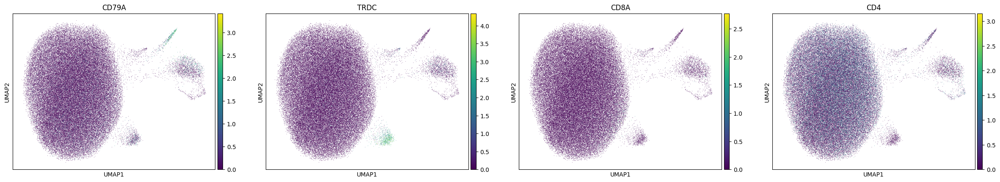

In [21]:
sc.pl.umap(adata, color=['CD79A','TRDC','CD8A','CD4'], legend_loc='on data')

In [3]:
adata = sc.read_h5ad('h5_by_celltype_clustered/' + 'Plasma cell.h5ad')

filtered_leiden = QC_table[QC_table['AIFI_L3'] == adata.obs['AIFI_L3'][0]]['leiden'].tolist()
adata_cleaned = adata[~adata.obs['leiden'].isin([str(i) for i in filtered_leiden])]

In [5]:
adata_cleaned.obs['sample.visitName'].value_counts()

sample.visitName
Flu Year 1 Day 7           2838
Flu Year 1 Day 0           1723
Flu Year 2 Day 7           1585
Immune Variation Day 0     1398
Flu Year 1 Day 90          1385
Flu Year 2 Day 0           1166
Flu Year 2 Day 90          1112
Immune Variation Day 7     1060
Immune Variation Day 90     930
Flu Year 3 Stand-Alone      862
Flu Year 2 Stand-Alone      296
Flu Year 1 Stand-Alone      182
Name: count, dtype: int64

In [4]:
adata1 = sc.read_h5ad('h5_by_celltype_clustered/' + 'CD8 MAIT.h5ad')

filtered_leiden = QC_table[QC_table['AIFI_L3'] == adata1.obs['AIFI_L3'][0]]['leiden'].tolist()
adata_cleaned = adata1[~adata1.obs['leiden'].isin([str(i) for i in filtered_leiden])]

In [5]:
adata=adata.raw.to_adata()
adata1=adata1.raw.to_adata()

In [6]:
adata.obs['leiden']=["CD4 MAIT-C"+i for i in adata.obs['leiden']]

In [7]:
adata1.obs['leiden']=["CD8 MAIT-C"+i for i in adata1.obs['leiden']]

In [8]:
adata_combined=anndata.concat([adata,adata1])

In [9]:
sc.pp.highly_variable_genes(adata_combined)
adata_combined = adata_combined[:, adata_combined.var.highly_variable]
sc.pp.scale(adata_combined, max_value=10)
sc.tl.pca(adata_combined, svd_solver='arpack')
sc.pp.neighbors(adata_combined, n_neighbors=50, n_pcs=30)
sc.tl.umap(adata_combined)

  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


In [10]:
adata_combined

AnnData object with n_obs × n_vars = 379330 × 1154
    obs: 'barcodes', 'batch_id', 'cell_name', 'cell_uuid', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'subject.biologicalSex', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'cohort.cohortGuid', 'sample.visitName', 'sample.visitDetails', 'subject.birthYear', 'CMV.IgG.Serology.Result.Interpretation', 'BMI', 'predicted_doublet', 'doublet_score', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3', 'AIFI_L3.5', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersion

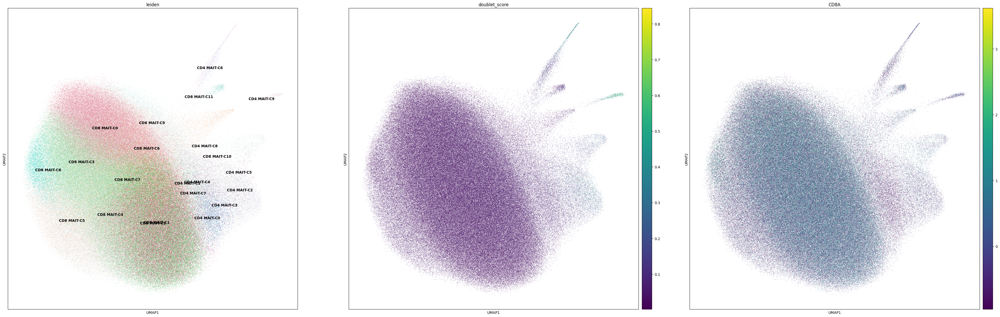

In [11]:
plt.rcParams['figure.figsize'] = [15, 15]
sc.pl.umap(adata_combined, color=['leiden','doublet_score','CD8A'], legend_loc='on data',size=2)

# Split Cleaned Object into h5ad by samples

In [108]:
files = os.listdir("h5_by_celltype_clustered/")
QC_table=pd.read_csv('BRI Doublet QC - Sheet1.csv')
QC_table = QC_table[~QC_table['Notes'].str.contains('\?', regex=True)]

In [ ]:
%%time

def process_file(file, QC_table):
    print("Reading: "+file)
    adata_clustered = sc.read_h5ad('h5_by_celltype_clustered/' + file)

    filtered_leiden = QC_table[QC_table['AIFI_L3'] == adata_clustered.obs['AIFI_L3'][0]]['leiden'].tolist()
    adata_clustered = adata_clustered[~adata_clustered.obs['leiden'].isin([str(i) for i in filtered_leiden])]
    adata_clustered.write_h5ad('h5_cleaned_by_celltype_claire/' + adata_clustered.obs['AIFI_L3'][0] + '.h5ad')


with multiprocessing.Pool(processes=30) as pool:
    results = pool.starmap(process_file, [(f, QC_table) for f in files])

Reading: ISG+ CD16 monocyte.h5adReading: CD14+ cDC2.h5adReading: HLA-DRhi cDC2.h5adReading: KLRF1- effector Vd1 gdT.h5adReading: cDC1.h5adReading: GZMK+ Vd2 gdT.h5adReading: CD8aa.h5adReading: C1Q+ CD16 monocyte.h5adReading: GZMK+ CD56dim NK cell.h5adReading: CD95 memory B cell.h5adReading: KLRF1+ GZMB+ CD27- EM CD8 T cell.h5adReading: GZMK- CD56dim NK cell.h5adReading: Proliferating NK cell.h5adReading: Memory CD8 Treg.h5adReading: GZMK- CD27+ EM CD8 T cell.h5adReading: CD4 MAIT.h5ad

Reading: CMP cell.h5adReading: Intermediate monocyte.h5ad

Reading: pDC.h5adReading: KLRB1+ memory CD8 Treg.h5adReading: Core CD14 monocyte.h5adReading: Erythrocyte.h5adReading: SOX4+ Vd1 gdT.h5ad
Reading: GZMB+ Vd2 gdT.h5ad
Reading: Platelet.h5ad



Reading: Transitional B cell.h5adReading: GZMB- CD27+ EM CD4 T cell.h5ad


Reading: ILC.h5adReading: GZMK+ memory CD4 Treg.h5adReading: CD56bright NK cell.h5ad
















Reading: Core memory B cell.h5ad
Reading: KLRB1+ memory CD4 Treg.h5ad
Reading: CM 

Process ForkPoolWorker-82:
Process ForkPoolWorker-84:
Process ForkPoolWorker-67:
Process ForkPoolWorker-85:
Process ForkPoolWorker-63:
Process ForkPoolWorker-71:
Process ForkPoolWorker-64:
Process ForkPoolWorker-80:
Process ForkPoolWorker-77:
Process ForkPoolWorker-81:
Process ForkPoolWorker-68:
Process ForkPoolWorker-78:
Process ForkPoolWorker-69:
Process ForkPoolWorker-74:
Process ForkPoolWorker-87:
Process ForkPoolWorker-66:
Process ForkPoolWorker-61:
Process ForkPoolWorker-89:
Process ForkPoolWorker-65:
Process ForkPoolWorker-90:
Process ForkPoolWorker-75:
Process ForkPoolWorker-72:
Process ForkPoolWorker-70:
Process ForkPoolWorker-73:
Process ForkPoolWorker-79:
Process ForkPoolWorker-88:
Process ForkPoolWorker-62:


In [10]:
%%time

def process_file(file, QC_table):
    print("Reading: "+file)
    adata_clustered = sc.read_h5ad('h5_by_celltype_clustered/' + file)
    leiden_annotation=adata_clustered.obs[['barcodes','leiden']]
    del adata_clustered
    gc.collect()
    adata_raw = sc.read_h5ad('h5_by_celltype/'+file)

    if np.array_equal(adata_raw.obs['barcodes'], leiden_annotation['barcodes']):
        adata_raw.obs['leiden'] = leiden_annotation['leiden'].tolist()

    filtered_leiden = QC_table[QC_table['AIFI_L3'] == adata_raw.obs['AIFI_L3'][0]]['leiden'].tolist()
    adata_raw_cleaned = adata_raw[~adata_raw.obs['leiden'].isin([str(i) for i in filtered_leiden])]

    del adata_raw
    del adata_raw_cleaned.var
    del adata_raw_cleaned.uns
    del adata_raw_cleaned.obsm
    del adata_raw_cleaned.obsp
    del adata_raw_cleaned.obs['leiden']
    gc.collect()
    print(file+' Done!')
    return adata_raw_cleaned

with multiprocessing.Pool(processes=20) as pool:
    results = pool.starmap(process_file, [(f, QC_table) for f in files])
    

Reading: CD14+ cDC2.h5adReading: cDC1.h5adReading: KLRF1- effector Vd1 gdT.h5adReading: ISG+ CD16 monocyte.h5adReading: GZMK+ Vd2 gdT.h5adReading: HLA-DRhi cDC2.h5adReading: GZMK+ CD56dim NK cell.h5adReading: CD95 memory B cell.h5adReading: CD8aa.h5adReading: GZMK- CD27+ EM CD8 T cell.h5ad

Reading: C1Q+ CD16 monocyte.h5ad
Reading: KLRF1+ GZMB+ CD27- EM CD8 T cell.h5adReading: GZMK- CD56dim NK cell.h5adReading: Memory CD8 Treg.h5ad



Reading: CD4 MAIT.h5ad
Reading: Proliferating NK cell.h5ad



Reading: Intermediate monocyte.h5adReading: SOX4+ Vd1 gdT.h5adReading: CMP cell.h5adReading: KLRB1+ memory CD8 Treg.h5ad







Memory CD8 Treg.h5ad Done!
Reading: pDC.h5ad
KLRB1+ memory CD8 Treg.h5ad Done!
Reading: Erythrocyte.h5ad
SOX4+ Vd1 gdT.h5ad Done!
Reading: Core CD14 monocyte.h5ad
cDC1.h5ad Done!
Reading: GZMB+ Vd2 gdT.h5ad
CMP cell.h5ad Done!
Reading: Platelet.h5ad
CD8aa.h5ad Done!
Reading: ILC.h5ad
CD4 MAIT.h5ad Done!
Reading: GZMB- CD27+ EM CD4 T cell.h5ad
KLRF1- effector Vd1 gdT.h5

In [11]:
def subset_adata(adata, sample_id):

    subset = adata[adata.obs['pbmc_sample_id'] == sample_id].copy()
    return subset


In [12]:
meta_data=pd.read_csv('/home//jupyter/BRI_Analysis/scRNA/hise_meta_data_2024-01-23_fixed.csv')
sample_ids = meta_data['pbmc_sample_id'].tolist()

In [ ]:
%%time
for pbmc_sample_id in tqdm(sample_ids, desc="splitting samples"):
    single_sample_adata = []
    for adata_single_celltype in results:
        adata_single_celltype_subset = subset_adata(adata_single_celltype, pbmc_sample_id)
        single_sample_adata.append(adata_single_celltype_subset)
    single_sample_adata_combined = anndata.concat(single_sample_adata)
    single_sample_adata_combined.write_h5ad('h5_cleaned_by_sample/' + pbmc_sample_id + '.h5ad')
    del single_sample_adata, single_sample_adata_combined
    gc.collect()

splitting samples:  60% 517/868 [20:10<13:47,  2.36s/it]

In [ ]:
for adata in results: 
    adata.write_h5ad('h5_cleaned_by_celltype_claire/' + adata.obs['AIFI_L3'][0] + '.h5ad')

In [ ]:
counts_df_filtered=pd.DataFrame()
for adata in results: 
    counts_df_filtered=pd.concat([counts_df_filtered,pd.DataFrame(    adata.obs['AIFI_L3'].value_counts()).reset_index()])
counts_df_filtered.to_csv('AIFI_L3_BRI_counts_cleaned.csv')

# Check how much Doublet removed

In [41]:
counts_df=pd.read_csv('AIFI_L3_BRI_counts.csv')
counts_df=counts_df.sort_values('AIFI_L3').reset_index()[['AIFI_L3','count']]
counts_df_filtered=pd.read_csv('AIFI_L3_BRI_counts_cleaned.csv')
counts_df_filtered=counts_df_filtered.sort_values('AIFI_L3').reset_index()[['AIFI_L3','count']]


In [42]:
counts_df.columns=['AIFI_L3','count_unfiltered']
counts_df_filtered.columns=['AIFI_L3','count_filtered']

In [43]:
df=pd.merge(counts_df,counts_df_filtered,how="left",on='AIFI_L3')

In [44]:
df['number_filtered']=df['count_unfiltered']-df['count_filtered']

In [45]:
df['percentage_filtered']=df['number_filtered']/df['count_unfiltered']

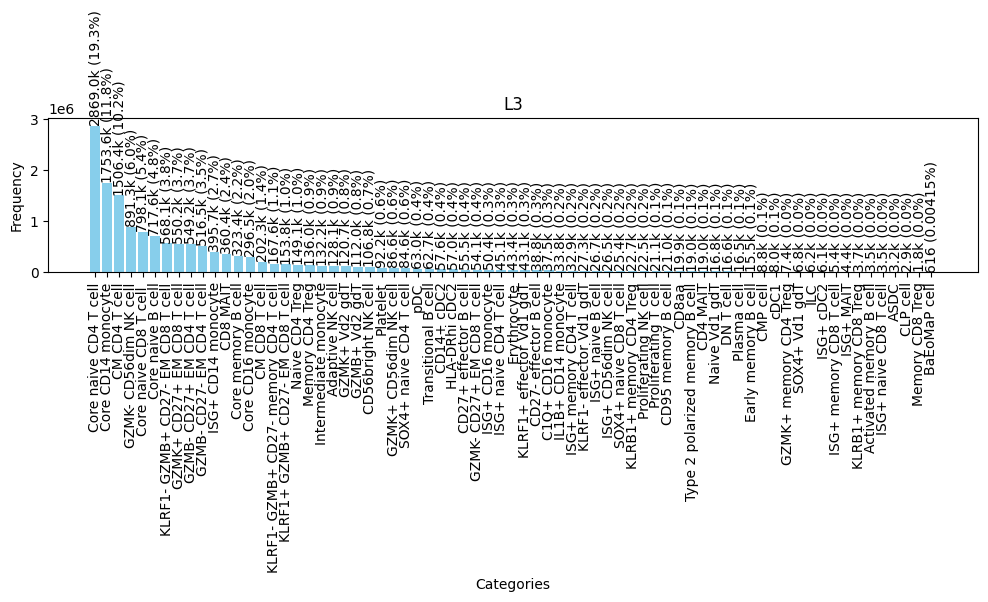

In [99]:
frequency_count_sorted = df.sort_values('count_unfiltered',ascending=False)

frequency_count_sorted.index=frequency_count_sorted['AIFI_L3']
frequency_count_sorted=frequency_count_sorted['count_unfiltered']

plt.figure(figsize=(12, 2))  
total_frequency = sum(frequency_count_sorted)

bars = plt.bar(list(frequency_count_sorted.keys()), list(frequency_count_sorted.values), color='skyblue')

for bar in bars:
    height = bar.get_height()  
    percentage = (height / total_frequency) * 100  
    
    # Formatting the label with 'k' for thousands
    if height >= 1000:
        label = f"{height/1000:.1f}k ({percentage:.1f}%)"
    else:
        label = f"{int(height)} ({percentage:.5f}%)"

    plt.text(bar.get_x() + bar.get_width() / 2, height, label, 
             va='bottom', ha='center', rotation='vertical')  

plt.xlabel('Categories')
plt.ylabel('Frequency')
plt.title('L3')
plt.xticks(rotation='vertical')  

plt.show()



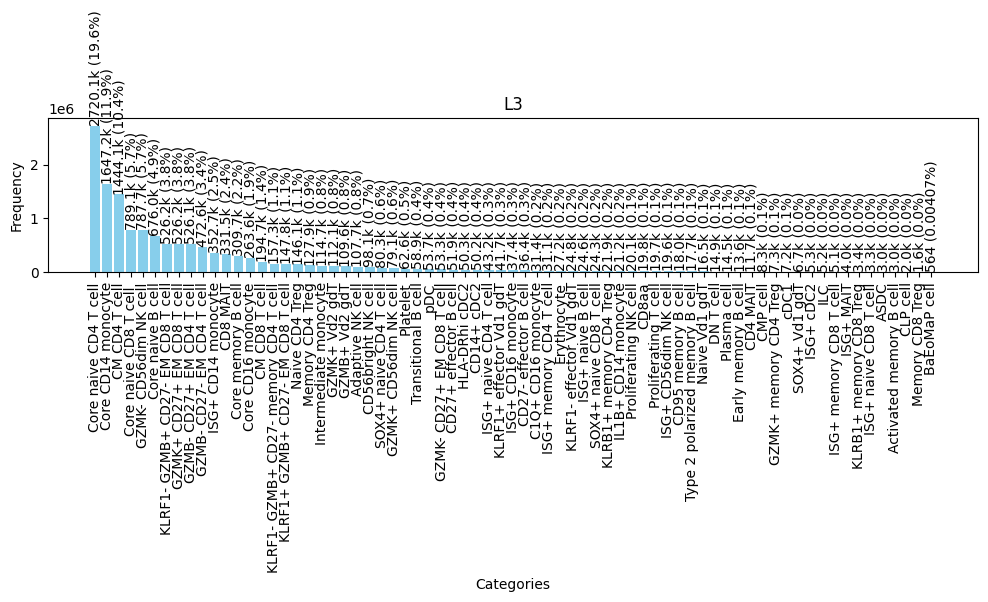

In [98]:
frequency_count_sorted = df.sort_values('count_filtered',ascending=False)

frequency_count_sorted.index=frequency_count_sorted['AIFI_L3']
frequency_count_sorted=frequency_count_sorted['count_filtered']

plt.figure(figsize=(12, 2)) 
total_frequency = sum(frequency_count_sorted)

bars = plt.bar(list(frequency_count_sorted.keys()), list(frequency_count_sorted.values), color='skyblue')

for bar in bars:
    height = bar.get_height()  
    percentage = (height / total_frequency) * 100  
    
    if height >= 1000:
        label = f"{height/1000:.1f}k ({percentage:.1f}%)"
    else:
        label = f"{int(height)} ({percentage:.5f}%)"

    plt.text(bar.get_x() + bar.get_width() / 2, height, label, 
             va='bottom', ha='center', rotation='vertical')  

plt.xlabel('Categories')
plt.ylabel('Frequency')
plt.title('L3')
plt.xticks(rotation='vertical') 

plt.show()


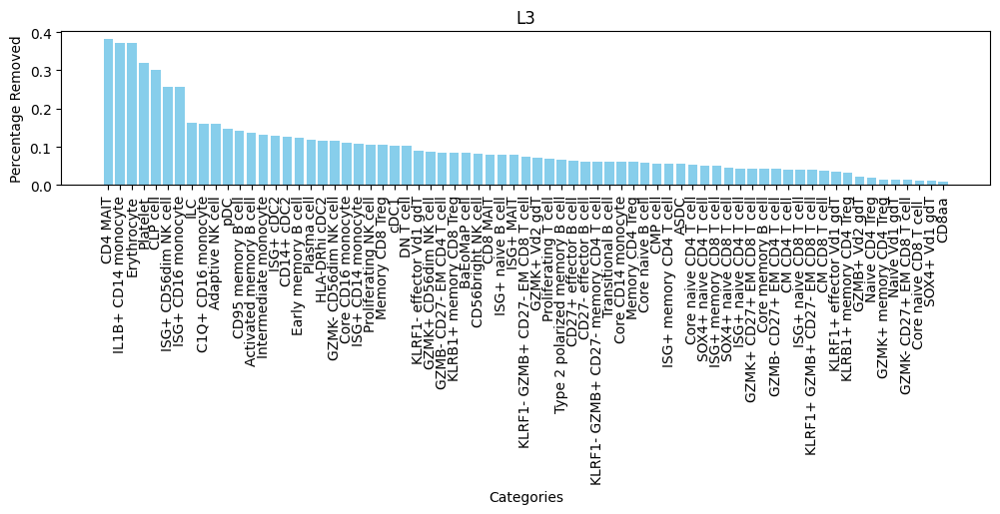

In [101]:
frequency_count_sorted = df.sort_values('percentage_filtered',ascending=False)

frequency_count_sorted.index=frequency_count_sorted['AIFI_L3']
frequency_count_sorted=frequency_count_sorted['percentage_filtered']

plt.figure(figsize=(12, 2))  


bars = plt.bar(list(frequency_count_sorted.keys()), list(frequency_count_sorted.values), color='skyblue')


plt.xlabel('Categories')
plt.ylabel('Percentage Removed')
plt.title('L3')
plt.xticks(rotation='vertical') 

plt.show()
